In [1]:
import pandas as pd
import plotly.express as px
!pip install plotly
import seaborn as sns
from matplotlib import pyplot as plt
import numpy as np
from scipy import stats as st
import math as mth

# Анализ поведения пользователей в мобильном приложении

## Материалы

+ __Презентация__: (https://drive.google.com/file/d/1Wodat6XpTyDkOFpDb-DaYKa6_tk_jdg1/view?usp=sharing)
+ __Дашборд__: (https://public.tableau.com/app/profile/galiya8877/viz/final_project_mobile_16343323782810/Dashboard1?publish=yes)


__Цель анализа:__

Определить, как введенные ранее фичи приложения влияют на совершение целевого действия пользователями.

__Задача анализа:__

Ответить на вопросы:

1. Есть ли связь между целевыми и остальными событиями в приложении? Как они влияют друг на друга?

2. Различается ли конверсия в просмотры контактов у разных групп пользователей?


__Заказчик:__

Топ-менеджеры.


## Декомпозиция задачи
<br>
Определим шаги проведения анализа:
<br>
<br>
1. Предобработка: изучить выгрузки на предмет соответвия типам данных, наличие пропусков, дубликатов, выбросов, ошибок и т.д.
<br>
2. Исследовательский анализ данных.
<br>
<br>
3. Анализ влияния событий на совершение целевого события: 

    3.1. Сгруппировать данные по пользователям и определить, какие действия совершил каждый, по сколько раз.<br>
    3.2. К сводной таблице подтянуть данные об источниках, по которым пришли пользователи.<br>
    3.3. Рассчитать корреляцию между количеством целевых и других совершенных событий.<br>
    3.4. Для каждого пользователя рассчитать время с момента первого действия в приложении до момента совершения целевого действия.<br>
    3.5. Рассчитать корреляцию между временем на совершение целевого действия и количеством каждого типа события.<br>
    3.6. Разделить датасет на 2 группы пользователей -- совершали целевое действие и не совершали. Сравнить метрики между собой.<br>
    3.7. Для каждого действия в приложении выделить по 2 группы пользователей -- совершали и не совершали -- и сравнить корреляцию с целевым действием.<br>
    3.8. Разделить таблицу на 3 по источникам привлечения пользователей, рассчитать те же показатели и сравнить между собой.<br>

<br>
<br>
4. Проверка гипотез:

    4.1. __Первая Н0__: Конверсия в просмотры контактов одинакова у двух групп пользователей: 1) совершают действия tips_show и tips_click; 2) совершают только tips_show.
    4.2. __Вторая Н0__: Конверсия в просмотры контактов одинакова у двух групп пользователей: 1) добавили объявление в избранное и 2) не добавляли объявления в избранное.
<br>
<br>
5. Построение дашборда.<br>
6. Формирование выводов.<br>
7. Презентация.

## Предобработка

Импортируем датасеты и проверим качество данных.

In [2]:
dataset = pd.read_csv('mobile_dataset.csv')
display(dataset.head())

,event.time,event.name,user.id
0,2019-10-07 00:00:00.431357,advert_open,020292ab-89bc-4156-9acf-68bc2783f894
1,2019-10-07 00:00:01.236320,tips_show,020292ab-89bc-4156-9acf-68bc2783f894
2,2019-10-07 00:00:02.245341,tips_show,cf7eda61-9349-469f-ac27-e5b6f5ec475c
3,2019-10-07 00:00:07.039334,tips_show,020292ab-89bc-4156-9acf-68bc2783f894
4,2019-10-07 00:00:56.319813,advert_open,cf7eda61-9349-469f-ac27-e5b6f5ec475c


In [3]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74197 entries, 0 to 74196
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   event.time  74197 non-null  object
 1   event.name  74197 non-null  object
 2   user.id     74197 non-null  object
dtypes: object(3)
memory usage: 1.7+ MB


In [4]:
# переименуем названия столбцов, чтобы в последующем не допустить ошибок из-за знаков препинания
dataset.columns = ['event_time','event_name','user_id']

In [5]:
# преобразуем тип данных в столбце с датой и временем 
dataset['event_time'] = pd.to_datetime(dataset['event_time'])

In [6]:
# выделим в отдельные столбцы значение дат и часа событий
dataset['event_date'] = dataset['event_time'].dt.date
dataset['event_hour'] = dataset['event_time'].dt.hour

In [7]:
display(dataset.head())

,event_time,event_name,user_id,event_date,event_hour
0,2019-10-07 00:00:00.431357,advert_open,020292ab-89bc-4156-9acf-68bc2783f894,2019-10-07,0
1,2019-10-07 00:00:01.236320,tips_show,020292ab-89bc-4156-9acf-68bc2783f894,2019-10-07,0
2,2019-10-07 00:00:02.245341,tips_show,cf7eda61-9349-469f-ac27-e5b6f5ec475c,2019-10-07,0
3,2019-10-07 00:00:07.039334,tips_show,020292ab-89bc-4156-9acf-68bc2783f894,2019-10-07,0
4,2019-10-07 00:00:56.319813,advert_open,cf7eda61-9349-469f-ac27-e5b6f5ec475c,2019-10-07,0


In [8]:
# проверим наличие дублирующихся строк
print(dataset.duplicated().sum())

0


In [9]:
dataset.describe(include='all')

/var/folders/h2/gf7yx6_d6kdf_cxcjlmdjtrm0000gp/T/ipykernel_25633/1519417330.py:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  dataset.describe(include='all')


,event_time,event_name,user_id,event_date,event_hour
count,74197,74197,74197,74197,74197.000000
unique,74197,16,4293,28,NaN
top,2019-10-07 00:00:00.431357,tips_show,cb36854f-570a-41f4-baa8-36680b396370,2019-10-23,NaN
freq,1,40055,478,3361,NaN
first,2019-10-07 00:00:00.431357,NaN,NaN,NaN,NaN
last,2019-11-03 23:58:12.532487,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,14.964891
std,NaN,NaN,NaN,NaN,5.288860
min,NaN,NaN,NaN,NaN,0.000000
25%,NaN,NaN,NaN,NaN,12.000000


Всего в выгрузке данные о 74 197 уникальных событиях, которые были совершены 4 293 пользователями. Данные за период 7.10.2019 по 03.11.2019. 16 названий действий. Выведем эти названия и проверим, какие из них можно объединить

In [10]:
dataset['event_name'].unique()

array(['advert_open', 'tips_show', 'map', 'contacts_show', 'search_4',
       'search_5', 'tips_click', 'photos_show', 'search_1', 'search_2',
       'search_3', 'favorites_add', 'contacts_call', 'search_6',
       'search_7', 'show_contacts'], dtype=object)

*contacts_show* и *show_contacts* -- одинаковые действия, записанные по-разному, поэтому можем их объединить.
<br>
Разные виды посика (*search_1* -- *search_7*) тоже можем объединить в 1 группу, т.к. это один вид действия, и бизнесу не важно, есть ли различия в какой из групп конверсия в целевое действие выше. 

In [11]:
# заменим некоторые значения действий и таким образом объединим идентичные под одним названием
dataset['event_name'].replace({'contacts_show':'show_contacts','search_1':'search', 'search_2':'search', 'search_3':'search', 'search_4':'search', 'search_5':'search', 'search_6':'search', 'search_7':'search'},inplace=True)

In [12]:
dataset['event_name'].unique()

array(['advert_open', 'tips_show', 'map', 'show_contacts', 'search',
       'tips_click', 'photos_show', 'favorites_add', 'contacts_call'],
      dtype=object)

In [13]:
dataset.describe(include='all')

/var/folders/h2/gf7yx6_d6kdf_cxcjlmdjtrm0000gp/T/ipykernel_25633/1519417330.py:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  dataset.describe(include='all')


,event_time,event_name,user_id,event_date,event_hour
count,74197,74197,74197,74197,74197.000000
unique,74197,9,4293,28,NaN
top,2019-10-07 00:00:00.431357,tips_show,cb36854f-570a-41f4-baa8-36680b396370,2019-10-23,NaN
freq,1,40055,478,3361,NaN
first,2019-10-07 00:00:00.431357,NaN,NaN,NaN,NaN
last,2019-11-03 23:58:12.532487,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,14.964891
std,NaN,NaN,NaN,NaN,5.288860
min,NaN,NaN,NaN,NaN,0.000000
25%,NaN,NaN,NaN,NaN,12.000000


После объединения нескольких видов действий в одну осталось 9 уникальных видов событий. Большинство действий происходило в 15 часов.

In [14]:
sources = pd.read_csv('mobile_sources.csv')
display(sources.head())

,userId,source
0,020292ab-89bc-4156-9acf-68bc2783f894,other
1,cf7eda61-9349-469f-ac27-e5b6f5ec475c,yandex
2,8c356c42-3ba9-4cb6-80b8-3f868d0192c3,yandex
3,d9b06b47-0f36-419b-bbb0-3533e582a6cb,other
4,f32e1e2a-3027-4693-b793-b7b3ff274439,google


In [15]:
sources.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4293 entries, 0 to 4292
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   userId  4293 non-null   object
 1   source  4293 non-null   object
dtypes: object(2)
memory usage: 67.2+ KB


In [16]:
# переименуем названия столбца с id пользователя так, чтобы можно было объединить с другой таблицей
sources.columns = ['user_id','source']

In [17]:
print(sources.duplicated().sum())

0


In [18]:
sources.describe()

,user_id,source
count,4293,4293
unique,4293,3
top,020292ab-89bc-4156-9acf-68bc2783f894,yandex
freq,1,1934


In [19]:
sources['source'].unique()

array(['other', 'yandex', 'google'], dtype=object)

Всего в выгрузке данные о 4 293 уникальных пользователях, которые пришли через 1 из 3 источников. В сравнении с остальными, больше пользователей пришли через yandex.

<br>

### Вывод по итогам предобработки

Импортировали данные, заменили названия столбцов так, чтобы не возникало проблем со знаком препинания и можно было объединить обе таблицы. Заменили тип данных по столбцу с датой и временем событий, объединили некоторые названия событий.
Дублирующихся строк и пропущенных значений в таблицах нет.
<br>
<br>

## Исследовательский анализ


In [20]:
# построим график распределения количества событий по дням
fig_date = px.histogram(dataset, x = 'event_date', marginal = 'box', opacity = 0.8, title = 'Распределение количества событий по дням')
fig_date.update_layout(xaxis_title="дата",
    yaxis_title="количество действий")
fig_date.show()

В основном количество действий распределены равномерно, заметно их небольшое увеличение, начиная с 13 октября. Проверим распределение в разрезе каждого вида действия.

In [21]:
# в отдельной таблице сгруппируем данные по названиям событий и датам, вычислим количество событий для каждой группы
dataset_date_group = dataset.groupby(['event_name','event_date'])['event_time'].count().reset_index()
display(dataset_date_group.head())

,event_name,event_date,event_time
0,advert_open,2019-10-07,401
1,advert_open,2019-10-08,206
2,advert_open,2019-10-09,130
3,advert_open,2019-10-10,105
4,advert_open,2019-10-11,109


In [22]:
# построим график динамики количества событий каждого вида действия по дням
fig_event_date = px.line(dataset_date_group, x='event_date', y='event_time', color='event_name', title='Динамика количества событий по дням')
fig_event_date.update_layout(xaxis_title="дата",
    yaxis_title="количество действий")
fig_event_date.show()

In [23]:
# сгруппируем данные по виду действий и часам
dataset_hour_group = dataset.groupby(['event_name','event_hour'])['event_time'].count().reset_index()
display(dataset_hour_group.head())

,event_name,event_hour,event_time
0,advert_open,0,117
1,advert_open,1,80
2,advert_open,2,77
3,advert_open,3,44
4,advert_open,4,36


In [24]:
# построим график динамики количества каждого вида событий в течение дня
fig_event_hour = px.line(dataset_hour_group, x='event_hour', y='event_time', color='event_name', title='Динамика количества событий часам')
fig_event_hour.update_layout(xaxis_title="время",
    yaxis_title="количество действий")
fig_event_hour.show()

In [25]:
# рассчитаем количество событий на каждого пользователя
dataset_user_group = dataset.groupby(['user_id'])['event_time'].count().reset_index()
dataset_user_group.columns = ['user_id','events_count']
display(dataset_user_group.head())

,user_id,events_count
0,0001b1d5-b74a-4cbf-aeb0-7df5947bf349,35
1,00157779-810c-4498-9e05-a1e9e3cedf93,71
2,00463033-5717-4bf1-91b4-09183923b9df,10
3,004690c3-5a84-4bb7-a8af-e0c8f8fca64e,32
4,00551e79-152e-4441-9cf7-565d7eb04090,8


In [26]:
# построим график распределения количества событий на 1 пользователя
fig_users = px.histogram(dataset_user_group, x = 'events_count', marginal = 'box', opacity = 0.8, title = 'Распределение количества событий на каждого пользователя за весь период')
fig_users.update_layout(xaxis_title="количество действий",
    yaxis_title="количество пользователей")
fig_users.show()

По гистограмме и boxplot видим, что основная масса пользователей совершили до 35 действий за весь период, начиная с 36 -- можно считать выбросами. Попробуем исключить действия данных пользователей из основной таблицы.

In [27]:
dataset_2 = dataset.merge(dataset_user_group, on='user_id', how='outer')
display(dataset_2.head())

,event_time,event_name,user_id,event_date,event_hour,events_count
0,2019-10-07 00:00:00.431357,advert_open,020292ab-89bc-4156-9acf-68bc2783f894,2019-10-07,0,28
1,2019-10-07 00:00:01.236320,tips_show,020292ab-89bc-4156-9acf-68bc2783f894,2019-10-07,0,28
2,2019-10-07 00:00:07.039334,tips_show,020292ab-89bc-4156-9acf-68bc2783f894,2019-10-07,0,28
3,2019-10-07 00:01:27.770232,advert_open,020292ab-89bc-4156-9acf-68bc2783f894,2019-10-07,0,28
4,2019-10-07 00:01:34.804591,tips_show,020292ab-89bc-4156-9acf-68bc2783f894,2019-10-07,0,28


In [28]:
dataset_2 = dataset_2.query('events_count < 36')
dataset_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 40527 entries, 0 to 74196
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   event_time    40527 non-null  datetime64[ns]
 1   event_name    40527 non-null  object        
 2   user_id       40527 non-null  object        
 3   event_date    40527 non-null  object        
 4   event_hour    40527 non-null  int64         
 5   events_count  40527 non-null  int64         
dtypes: datetime64[ns](1), int64(2), object(3)
memory usage: 2.2+ MB


Исключив действия пользователей с более 35 действиями, мы отсекаем 45% данных. Пока оставим исходный датасет и продолжим анализ этих данных.

###  Вывод по итогам исследовательского анализа

1. Наблюдается небольшое увеличение количества действий с 13 октября. В основном количество действий за весь период распределено равномерно.

2. Больше всего действий --  увидел рекомендованное объявление. Но кликают по ним всего до 50 раз в день. В дни, когда заметно меньше действий "увидел рекомендованное объявление", видим провалы и в общей сумме. Второй по количеству тип действий -- просмотр фотографий. 

3. Активный период в течение дня -- с 8 утра до 0 ночи. С 17 до 19 заметно падает количество увиденных рекомендованных объявлений -- можно предположить, что это связано с тем, что пользователи после работы едут домой и меньше сидят в приложении.

4. 75% пользователей совершило до 35 действий за весь период. При этом медианное значение -- 9 действий. Большое количество выбросов, но мы не можем исключить таких пользователей, т.к. они составляют 45% из всего датасета.


## Анализ влияния событий на совершение целевого события

### Время на совершение целевого действия

Для каждого пользователя вычислим время первого действия в приложении и первого целевого действия.

In [29]:
first_action = dataset.groupby('user_id')['event_time'].min().reset_index()
display(first_action.head())

,user_id,event_time
0,0001b1d5-b74a-4cbf-aeb0-7df5947bf349,2019-10-07 13:39:45.989359
1,00157779-810c-4498-9e05-a1e9e3cedf93,2019-10-19 21:34:33.849769
2,00463033-5717-4bf1-91b4-09183923b9df,2019-11-01 13:54:35.385028
3,004690c3-5a84-4bb7-a8af-e0c8f8fca64e,2019-10-18 22:14:05.555052
4,00551e79-152e-4441-9cf7-565d7eb04090,2019-10-25 16:44:41.263364


In [30]:
first_action.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4293 entries, 0 to 4292
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   user_id     4293 non-null   object        
 1   event_time  4293 non-null   datetime64[ns]
dtypes: datetime64[ns](1), object(1)
memory usage: 67.2+ KB


In [31]:
# найдем время первого целевого действия
first_show_contact = dataset.groupby(['user_id','event_name'])['event_time'].min().reset_index()
first_show_contact = first_show_contact.query('event_name == "show_contacts"').reset_index()
display(first_show_contact.head())

,index,user_id,event_name,event_time
0,7,00157779-810c-4498-9e05-a1e9e3cedf93,show_contacts,2019-10-20 19:17:18.659799
1,16,00551e79-152e-4441-9cf7-565d7eb04090,show_contacts,2019-10-25 16:44:41.263364
2,19,005fbea5-2678-406f-88a6-fbe9787e2268,show_contacts,2019-10-11 11:22:54.442841
3,26,00753c79-ea81-4456-acd0-a47a23ca2fb9,show_contacts,2019-10-20 14:57:06.080501
4,28,007d031d-5018-4e02-b7ee-72a30609173f,show_contacts,2019-10-22 13:08:09.140381


In [32]:
first_show_contact.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 981 entries, 0 to 980
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   index       981 non-null    int64         
 1   user_id     981 non-null    object        
 2   event_name  981 non-null    object        
 3   event_time  981 non-null    datetime64[ns]
dtypes: datetime64[ns](1), int64(1), object(2)
memory usage: 30.8+ KB


Всего 981 пользователей совершили целевое действие -- 22%.

In [33]:
# переименуем столбцы, чтобы не было путаницы в дальнейшем
first_action.columns = ['user_id','first_event_time']
first_show_contact = first_show_contact[['user_id','event_time']]
first_show_contact.columns = ['user_id','first_show_contact_time']

In [34]:
# объединим две таблицы в одну
first_events = first_action.merge(first_show_contact, on='user_id', how='outer')
display(first_events.head(10))

,user_id,first_event_time,first_show_contact_time
0,0001b1d5-b74a-4cbf-aeb0-7df5947bf349,2019-10-07 13:39:45.989359,NaT
1,00157779-810c-4498-9e05-a1e9e3cedf93,2019-10-19 21:34:33.849769,2019-10-20 19:17:18.659799
2,00463033-5717-4bf1-91b4-09183923b9df,2019-11-01 13:54:35.385028,NaT
3,004690c3-5a84-4bb7-a8af-e0c8f8fca64e,2019-10-18 22:14:05.555052,NaT
4,00551e79-152e-4441-9cf7-565d7eb04090,2019-10-25 16:44:41.263364,2019-10-25 16:44:41.263364
5,00554293-7e00-4122-b898-4e892c4a7c53,2019-10-27 12:32:28.005179,NaT
6,005fbea5-2678-406f-88a6-fbe9787e2268,2019-10-11 11:22:54.442841,2019-10-11 11:22:54.442841
7,00653802-5ff1-4071-bc17-347fc4cef569,2019-10-21 02:08:30.875020,NaT
8,006a32d4-ee10-40dc-b237-11e0fde81cbc,2019-10-08 21:24:24.975735,NaT
9,006f6ced-225b-4f9c-9f17-23404bc6835f,2019-10-13 10:21:52.569346,NaT


In [35]:
# вычислим разницу во времени с момента первого действия в приложении до целевого
first_events['delta_days'] = (first_events['first_show_contact_time'] - first_events['first_event_time'])/ np.timedelta64(1, 'D')
display(first_events.sort_values(by='delta_days', ascending=False).head(10))

,user_id,first_event_time,first_show_contact_time,delta_days
154,08ff0fce-e12b-4f7e-8680-34e105f7f537,2019-10-11 09:14:00.382039,2019-11-03 13:34:38.950700,23.181002
3417,cbfbc3ed-2ca7-468e-9d1e-3c321f35dcc9,2019-10-12 16:18:29.111366,2019-11-03 22:38:17.561256,22.263755
1975,771c9e69-4c82-4e02-a862-d56b40a29838,2019-10-11 12:25:56.046262,2019-11-02 18:03:57.471081,22.234739
4183,f9c19253-73e7-4b9e-9630-45353a792248,2019-10-14 09:09:14.282327,2019-11-03 11:39:32.218473,20.104374
3240,c21daf1f-e787-4a5c-9d92-62cd3dafc9b3,2019-10-07 14:32:55.398091,2019-10-25 15:38:49.696340,18.045767
4254,fd33e787-85c8-4c53-99bd-3439f676fb40,2019-10-11 19:35:30.139880,2019-10-29 02:22:09.928434,17.282405
2058,7b4b1fee-a552-4ea4-8c24-b4bfa4a96b03,2019-10-15 18:10:42.916969,2019-11-01 11:22:18.002822,16.716378
3485,d0033655-7741-4bee-8fd7-cb7383d095fc,2019-10-11 20:53:14.903866,2019-10-27 21:32:27.252227,16.027226
2853,aa3faea3-08b0-486d-9643-33f5fffb1d08,2019-10-16 12:21:48.748360,2019-11-01 08:53:51.597639,15.855589
2445,9085527d-9273-46f2-860d-39e0dcbfbfc2,2019-10-07 22:09:04.340064,2019-10-23 17:58:09.065835,15.825749


In [36]:
# создадим новую таблицу, в которой оставим только тех пользователей, которые совершили целевое действие
only_first_events = first_events.query('delta_days > 0')

In [37]:
# построим график распределения 
fig_time_to_show_contacts = px.histogram(only_first_events, x = 'delta_days', marginal = 'box', opacity = 0.8, title = 'Распределение времени (дней) на совершение первого целевого действия')
fig_time_to_show_contacts.update_layout(xaxis_title="количество дней",
    yaxis_title="количество пользователей")
fig_time_to_show_contacts.show()

75% пользователей требуется до 2.38 дней, чтобы совершить целевое действие. Медианное значение -- 0.016 дня (23 минуты).

In [38]:
# подтянем данные о первых событиях
dataset_2 = dataset.merge(first_events, on='user_id', how='outer')
display(dataset_2.sort_values(by='delta_days', ascending = False).head())

,event_time,event_name,user_id,event_date,event_hour,first_event_time,first_show_contact_time,delta_days
16077,2019-10-11 09:14:00.382039,photos_show,08ff0fce-e12b-4f7e-8680-34e105f7f537,2019-10-11,9,2019-10-11 09:14:00.382039,2019-11-03 13:34:38.950700,23.181002
16083,2019-11-03 13:05:58.345773,photos_show,08ff0fce-e12b-4f7e-8680-34e105f7f537,2019-11-03,13,2019-10-11 09:14:00.382039,2019-11-03 13:34:38.950700,23.181002
16089,2019-11-03 13:54:13.310594,photos_show,08ff0fce-e12b-4f7e-8680-34e105f7f537,2019-11-03,13,2019-10-11 09:14:00.382039,2019-11-03 13:34:38.950700,23.181002
16088,2019-11-03 13:54:04.640559,photos_show,08ff0fce-e12b-4f7e-8680-34e105f7f537,2019-11-03,13,2019-10-11 09:14:00.382039,2019-11-03 13:34:38.950700,23.181002
16087,2019-11-03 13:53:42.124669,photos_show,08ff0fce-e12b-4f7e-8680-34e105f7f537,2019-11-03,13,2019-10-11 09:14:00.382039,2019-11-03 13:34:38.950700,23.181002


Некоторые пользователи могли первым действием совершить целевое, но их предшествующие этому действия остались в данных за более ранний период. Поэтому исключим эти действия.

In [39]:
# исключим те первые действия, которые являются целевыми
dataset_3 = dataset_2.query('(event_time != first_show_contact_time) and (first_event_time != event_time)')

In [40]:
dataset_3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 69102 entries, 1 to 74196
Data columns (total 8 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   event_time               69102 non-null  datetime64[ns]
 1   event_name               69102 non-null  object        
 2   user_id                  69102 non-null  object        
 3   event_date               69102 non-null  object        
 4   event_hour               69102 non-null  int64         
 5   first_event_time         69102 non-null  datetime64[ns]
 6   first_show_contact_time  25414 non-null  datetime64[ns]
 7   delta_days               25414 non-null  float64       
dtypes: datetime64[ns](3), float64(1), int64(1), object(3)
memory usage: 4.7+ MB


Исключили больше 5 000 действий, хотя должны были отсеять меньше. Проверим от обратного.

In [41]:
# посмотрим, сколько первых действий -- целевое и должны были исключиться
dataset_4 = dataset_2.query('(event_time == first_show_contact_time) and (first_event_time == event_time)')

In [42]:
dataset_4.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 179 entries, 830 to 74187
Data columns (total 8 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   event_time               179 non-null    datetime64[ns]
 1   event_name               179 non-null    object        
 2   user_id                  179 non-null    object        
 3   event_date               179 non-null    object        
 4   event_hour               179 non-null    int64         
 5   first_event_time         179 non-null    datetime64[ns]
 6   first_show_contact_time  179 non-null    datetime64[ns]
 7   delta_days               179 non-null    float64       
dtypes: datetime64[ns](3), float64(1), int64(1), object(3)
memory usage: 12.6+ KB


Всего 179, попробуем исключить эти данные другим способом.

In [43]:
# добавим столбец, который в дальнейшем подтянем к основной таблице и будет признаком для исключения нужных строк
dataset_4['delete'] = [1] * len(dataset_4.index)

/var/folders/h2/gf7yx6_d6kdf_cxcjlmdjtrm0000gp/T/ipykernel_25633/1657946845.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [44]:
# подтянем этот столбец к общим данным
dataset_5 = dataset_2.merge(dataset_4, on=['event_time','event_name','user_id', 'event_date', 'event_hour', 'first_event_time', 'first_show_contact_time', 'delta_days'], how='outer')
display(dataset_5.head())

,event_time,event_name,user_id,event_date,event_hour,first_event_time,first_show_contact_time,delta_days,delete
0,2019-10-07 00:00:00.431357,advert_open,020292ab-89bc-4156-9acf-68bc2783f894,2019-10-07,0,2019-10-07 00:00:00.431357,NaT,NaN,NaN
1,2019-10-07 00:00:01.236320,tips_show,020292ab-89bc-4156-9acf-68bc2783f894,2019-10-07,0,2019-10-07 00:00:00.431357,NaT,NaN,NaN
2,2019-10-07 00:00:07.039334,tips_show,020292ab-89bc-4156-9acf-68bc2783f894,2019-10-07,0,2019-10-07 00:00:00.431357,NaT,NaN,NaN
3,2019-10-07 00:01:27.770232,advert_open,020292ab-89bc-4156-9acf-68bc2783f894,2019-10-07,0,2019-10-07 00:00:00.431357,NaT,NaN,NaN
4,2019-10-07 00:01:34.804591,tips_show,020292ab-89bc-4156-9acf-68bc2783f894,2019-10-07,0,2019-10-07 00:00:00.431357,NaT,NaN,NaN


In [45]:
dataset_5.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 74197 entries, 0 to 74196
Data columns (total 9 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   event_time               74197 non-null  datetime64[ns]
 1   event_name               74197 non-null  object        
 2   user_id                  74197 non-null  object        
 3   event_date               74197 non-null  object        
 4   event_hour               74197 non-null  int64         
 5   first_event_time         74197 non-null  datetime64[ns]
 6   first_show_contact_time  27197 non-null  datetime64[ns]
 7   delta_days               27197 non-null  float64       
 8   delete                   179 non-null    float64       
dtypes: datetime64[ns](3), float64(2), int64(1), object(3)
memory usage: 5.7+ MB


In [46]:
# исключаем 179 ненужных строк
dataset_final = dataset_5.query('delete != 1')
dataset_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 74018 entries, 0 to 74196
Data columns (total 9 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   event_time               74018 non-null  datetime64[ns]
 1   event_name               74018 non-null  object        
 2   user_id                  74018 non-null  object        
 3   event_date               74018 non-null  object        
 4   event_hour               74018 non-null  int64         
 5   first_event_time         74018 non-null  datetime64[ns]
 6   first_show_contact_time  27018 non-null  datetime64[ns]
 7   delta_days               27018 non-null  float64       
 8   delete                   0 non-null      float64       
dtypes: datetime64[ns](3), float64(2), int64(1), object(3)
memory usage: 5.6+ MB


In [47]:
# исключим ненужные столбцы
dataset_final = dataset_final.drop(['first_event_time','first_show_contact_time','delete'], 1)

/var/folders/h2/gf7yx6_d6kdf_cxcjlmdjtrm0000gp/T/ipykernel_25633/2957232965.py:2: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.



In [48]:
# в отдельной таблице для каждого пользователя определим разницу времени между первым действием в приложении и первым просмотром контактов
delta_days = dataset_final.groupby('user_id')['delta_days'].first().reset_index()
display(delta_days.head())

,user_id,delta_days
0,0001b1d5-b74a-4cbf-aeb0-7df5947bf349,NaN
1,00157779-810c-4498-9e05-a1e9e3cedf93,0.904685
2,00463033-5717-4bf1-91b4-09183923b9df,NaN
3,004690c3-5a84-4bb7-a8af-e0c8f8fca64e,NaN
4,00551e79-152e-4441-9cf7-565d7eb04090,0.000000


#### Вывод по времени на совершение целевого действия

1. 75% пользователей требуется до 2.38 дней, чтобы совершить целевое действие. Медианное значение -- 0.016 дня (23 минуты). Есть две группы: те, кто совершают его в течение первой сессии (почти сразу) и те, кто совершает его спустя какое-то время (несколько дней).

2. Исключили 179 первых действий пользователей, которые являются целевыми и могли повлиять на итоги анализа.



### Количество действий каждого вида на одного пользователя

Создадим сводную таблицу, в которой для каждого пользователя рассчитаем количество действий в разрезе каждого вида события.

In [49]:
dataset_pivot = dataset_final.pivot_table(index='user_id',columns='event_name', values='event_time', aggfunc='count').reset_index()
display(dataset_pivot.head(10))

event_name,user_id,advert_open,contacts_call,favorites_add,map,photos_show,search,show_contacts,tips_click,tips_show
0,0001b1d5-b74a-4cbf-aeb0-7df5947bf349,NaN,NaN,NaN,6.0,NaN,NaN,NaN,NaN,29.0
1,00157779-810c-4498-9e05-a1e9e3cedf93,2.0,5.0,2.0,NaN,33.0,18.0,11.0,NaN,NaN
2,00463033-5717-4bf1-91b4-09183923b9df,NaN,NaN,NaN,NaN,10.0,NaN,NaN,NaN,NaN
3,004690c3-5a84-4bb7-a8af-e0c8f8fca64e,5.0,NaN,NaN,6.0,NaN,17.0,NaN,NaN,4.0
4,00551e79-152e-4441-9cf7-565d7eb04090,NaN,3.0,NaN,NaN,1.0,1.0,2.0,NaN,NaN
5,00554293-7e00-4122-b898-4e892c4a7c53,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN,9.0
6,005fbea5-2678-406f-88a6-fbe9787e2268,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,2.0
7,00653802-5ff1-4071-bc17-347fc4cef569,NaN,NaN,NaN,NaN,5.0,NaN,NaN,NaN,NaN
8,006a32d4-ee10-40dc-b237-11e0fde81cbc,NaN,NaN,NaN,NaN,6.0,NaN,NaN,NaN,NaN
9,006f6ced-225b-4f9c-9f17-23404bc6835f,NaN,NaN,NaN,NaN,5.0,NaN,NaN,NaN,NaN


In [50]:
# расположим столбцы в порядке -- действия до цд, цд, действие после цд
# выведем название столбцов
cols = list(dataset_pivot.columns.values)
print(cols)

['user_id', 'advert_open', 'contacts_call', 'favorites_add', 'map', 'photos_show', 'search', 'show_contacts', 'tips_click', 'tips_show']


In [51]:
# располагаем в нужном порядке
dataset_pivot = dataset_pivot[['user_id', 'advert_open','favorites_add', 'map', 'photos_show', 'search','tips_click', 'tips_show','show_contacts','contacts_call']]

In [52]:
# в новом столбце рассчитаем сумму всех действий, предшествующих целевому
dataset_pivot['events_sum'] = dataset_pivot.iloc[:, 1:8].sum(axis=1)

In [53]:
# для каждого пользователя рассчитаем конверсию
dataset_pivot['cr_%'] = dataset_pivot['show_contacts'] / dataset_pivot['events_sum']

In [54]:
display(dataset_pivot.head())

event_name,user_id,advert_open,favorites_add,map,photos_show,search,tips_click,tips_show,show_contacts,contacts_call,events_sum,cr_%
0,0001b1d5-b74a-4cbf-aeb0-7df5947bf349,NaN,NaN,6.0,NaN,NaN,NaN,29.0,NaN,NaN,35.0,NaN
1,00157779-810c-4498-9e05-a1e9e3cedf93,2.0,2.0,NaN,33.0,18.0,NaN,NaN,11.0,5.0,55.0,0.2
2,00463033-5717-4bf1-91b4-09183923b9df,NaN,NaN,NaN,10.0,NaN,NaN,NaN,NaN,NaN,10.0,NaN
3,004690c3-5a84-4bb7-a8af-e0c8f8fca64e,5.0,NaN,6.0,NaN,17.0,NaN,4.0,NaN,NaN,32.0,NaN
4,00551e79-152e-4441-9cf7-565d7eb04090,NaN,NaN,NaN,1.0,1.0,NaN,NaN,2.0,3.0,2.0,1.0


In [55]:
dataset_pivot.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4287 entries, 0 to 4286
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   user_id        4287 non-null   object 
 1   advert_open    751 non-null    float64
 2   favorites_add  351 non-null    float64
 3   map            1456 non-null   float64
 4   photos_show    1095 non-null   float64
 5   search         1666 non-null   float64
 6   tips_click     322 non-null    float64
 7   tips_show      2801 non-null   float64
 8   show_contacts  947 non-null    float64
 9   contacts_call  213 non-null    float64
 10  events_sum     4287 non-null   float64
 11  cr_%           947 non-null    float64
dtypes: float64(11), object(1)
memory usage: 402.0+ KB


Построим графики распределения до заполнения пропусков, чтобы посмотреть, сколько действий 1 вида приходится на пользователя, который совершил его хотя бы 1 раз.

In [56]:
# построим распределение количества событий для каждого вида действий

features = ['advert_open','favorites_add', 'map', 'photos_show', 'search','tips_click', 'tips_show','show_contacts','contacts_call', 'events_sum', 'cr_%']

for col in features:
    
    fig_events = px.histogram(dataset_pivot, x = col, marginal = 'box', opacity = 0.8, title = 'Распределение количества событий на пользователя (совершавшего хотя бы 1 раз) '+col)
    
    fig_events.show()
            
    print()

In [57]:
# пропуски заменим 0
dataset_pivot = dataset_pivot.fillna(0)
display(dataset_pivot.head())

event_name,user_id,advert_open,favorites_add,map,photos_show,search,tips_click,tips_show,show_contacts,contacts_call,events_sum,cr_%
0,0001b1d5-b74a-4cbf-aeb0-7df5947bf349,0.0,0.0,6.0,0.0,0.0,0.0,29.0,0.0,0.0,35.0,0.0
1,00157779-810c-4498-9e05-a1e9e3cedf93,2.0,2.0,0.0,33.0,18.0,0.0,0.0,11.0,5.0,55.0,0.2
2,00463033-5717-4bf1-91b4-09183923b9df,0.0,0.0,0.0,10.0,0.0,0.0,0.0,0.0,0.0,10.0,0.0
3,004690c3-5a84-4bb7-a8af-e0c8f8fca64e,5.0,0.0,6.0,0.0,17.0,0.0,4.0,0.0,0.0,32.0,0.0
4,00551e79-152e-4441-9cf7-565d7eb04090,0.0,0.0,0.0,1.0,1.0,0.0,0.0,2.0,3.0,2.0,1.0


Теперь посмотрим, как изменились распределения с учетом всех пользователей.

In [58]:
for col in features:
    
    fig_events = px.histogram(dataset_pivot, x = col, marginal = 'box', opacity = 0.8, title = 'Распределение количества событий на пользователя (с учетом не совершаших) '+col)
    
    fig_events.show()
            
    print()

In [59]:
# исключим из таблицы данные по пользователям, которые не совершали других действий кроме целевых и звонков по телефону
dataset_pivot = dataset_pivot.query('events_sum > 0')
dataset_pivot.shape[0]

4235

Таких пользователей оказалось 52 пользователя. Посмотрим распределение количества нецелевых действий на пользователя.

In [60]:
fig_event_sum = px.histogram(dataset_pivot, x = 'events_sum', marginal = 'box', opacity = 0.8, title = 'Распределение количества нецелевых действий на пользователя')
fig_event_sum.update_layout(xaxis_title="количество нецелевых действий",
    yaxis_title="количество пользователей")
fig_event_sum.show()

#### Вывод по количеству действий на одного пользователя

1. 75% пользователей выполнили до 34 действий за весь период. Медианное значение 8. 1 пользователь совершил действий -- максимально 451 раз. 52 пользователя не совершали действий кроме целевого и звонка по номеру телефона.

2. Среди пользователей больше тех, кто "увидели рекомендованные объявления" -- 2 801 пользователей. 75% из тех, кто совершал его хотя бы 1 раз, совершали его до 31 раза, медианное значение 8.

На втором месте среди таких пользователей действия на поиске -- 1 666 пользователей. 75% из тех, кто совершал его хотя бы 1 раз, совершали до 7 раз за весь период, медианное значение 3.

Далее по количеству пользователей: открытие карты объявлений -- 1 456 пользователей (среднее медианное 1 раз), просмотр фотографий -- 1 095 пользователей (среднее медианно 2 раза).
Меньше всего пользователей, которые добавили в избранное (351 ) и кликнули по рекомендованному объявлению (322).

3. Посмотрели контакты 947 пользователей, в среднем выполняли действие 2 раза, звонили по этим номерам 213 пользователей, в среднем тоже по 2 раза.


<br>
<br>

### Корреляция между целевым и другими действиями пользователей

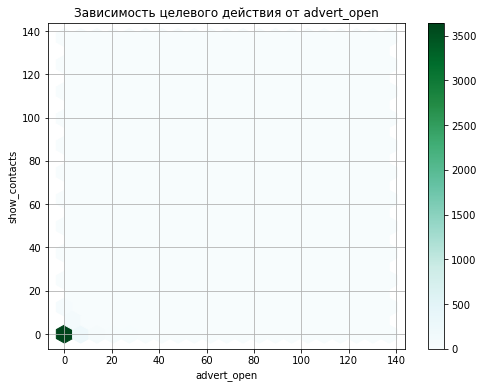

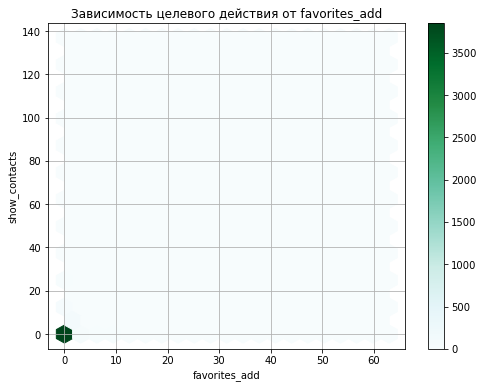

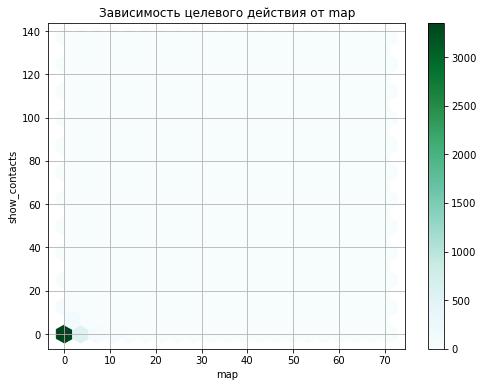

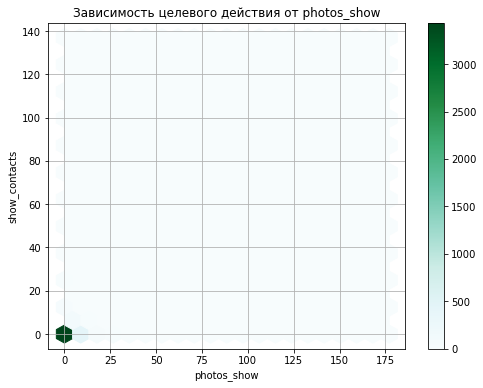

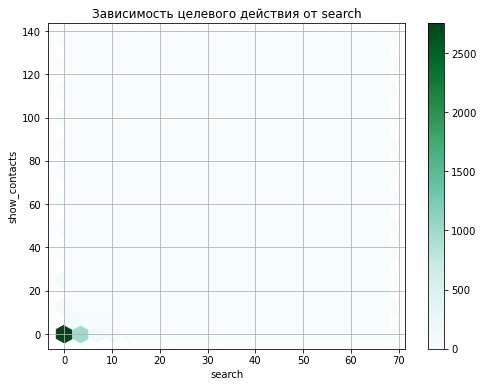

...

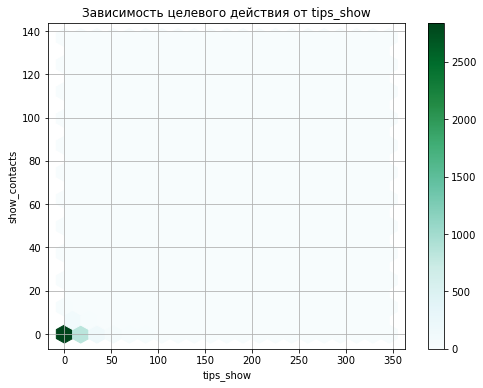

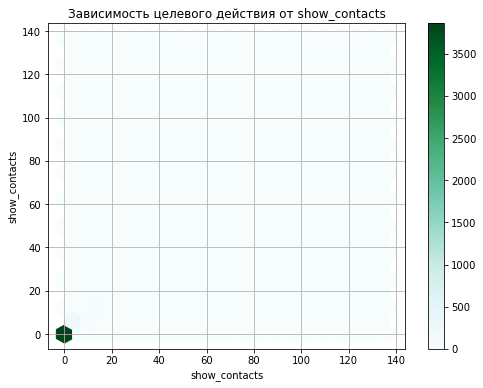

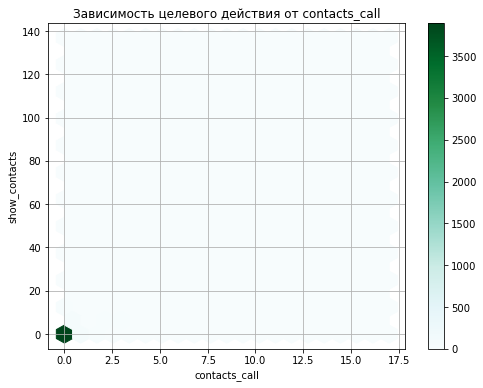

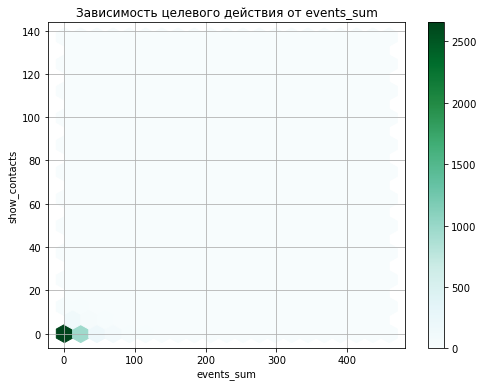

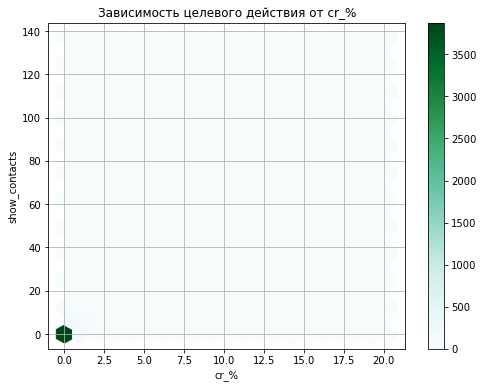

In [61]:
# построим диаграммы рассеяния, чтобы посмотреть взаимосвязи в данных

for col in features:
    
    dataset_pivot.plot(kind='hexbin', y='show_contacts', x=col, title='Зависимость целевого действия от ' + col, label='smart', legend=True, gridsize=20, figsize=(8, 6), sharex=False, grid=True)

Т.к. по каждому виду действия много пользователей, которые их не совершали или не совершали целевых, графики не информативны. Нужно рассчитать дополнительно коэффициент Пирсона.

In [62]:
# построим таблицу с коэффициентом Пирсона
data_corr = dataset_pivot.corr()
display(data_corr)

event_name,advert_open,favorites_add,map,photos_show,search,tips_click,tips_show,show_contacts,contacts_call,events_sum,cr_%
event_name,,,,,,,,,,,
advert_open,1.000000,0.173485,0.287958,0.027919,0.129722,0.018023,0.315926,0.058442,-0.022911,0.539200,-0.033395
favorites_add,0.173485,1.000000,0.185059,0.155562,0.081829,0.027351,0.143945,0.018365,0.019505,0.308284,-0.014353
map,0.287958,0.185059,1.000000,-0.037580,0.091309,0.225763,0.501441,0.333717,-0.045606,0.577023,-0.024485
photos_show,0.027919,0.155562,-0.037580,1.000000,0.216382,-0.050686,-0.098338,0.029691,0.156440,0.283652,-0.018235
search,0.129722,0.081829,0.091309,0.216382,1.000000,-0.025592,0.038889,0.074089,0.132387,0.283710,-0.026591
tips_click,0.018023,0.027351,0.225763,-0.050686,-0.025592,1.000000,0.294692,0.223216,-0.027830,0.270437,-0.010765
tips_show,0.315926,0.143945,0.501441,-0.098338,0.038889,0.294692,1.000000,0.446739,-0.072044,0.870066,-0.042027
show_contacts,0.058442,0.018365,0.333717,0.029691,0.074089,0.223216,0.446739,1.000000,0.190288,0.413177,0.338403
contacts_call,-0.022911,0.019505,-0.045606,0.156440,0.132387,-0.027830,-0.072044,0.190288,1.000000,0.004247,0.350164


In [63]:
# представим эту же таблицу более наглядно
# напишем функцию, которая будет стилизовать таблицу 
def corr_map_func(data):
    sns.set(style='white')
    plt.figure(figsize=(13, 9))
    plt.title('Cohorts: User Retention')
    sns.heatmap(data, annot=True, fmt='.1%', linewidths=1, linecolor='gray')

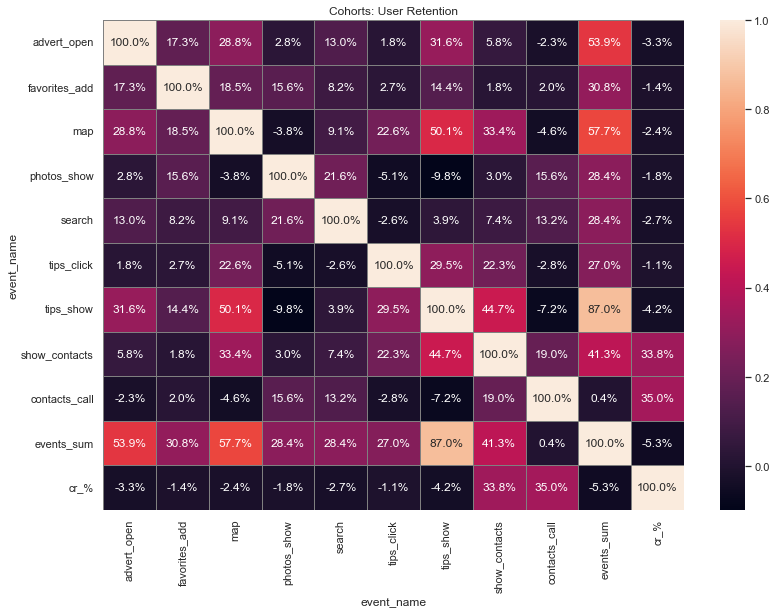

In [64]:
corr_map_func(data_corr)

#### Вывод по корреляции между действиями

Больше всего целевое действие коррелирует с действием "увидели рекомендованное объявление" -- положительная корреляция, сила связи 44.7% (чем больше выполнено этих действий, тем больше будет просмотров контактов). Что интересно: корреляция между просмотром контактов и звонками по номеру телефона положительная 19%, а между "увиденными рекомендованными объявлениями" и звонками -- отрицательная -7.2%.

Далее по уровню корреляции идут действия "просмотр карты объявлений" (33.4%) и "кликнули по рекомендованному объявлению" (22.3%). Здесь подобная ситуация: отрицательная корреляция с действием "звонок по номеру телефона".

Остальные виды действий показывают в разы меньшую силу связи, самая слабая -- с действием "добавили объявление в избранное" (1.8%).


Нужно отметить отрицательную связь между действием "посмотрели фотографию" с тремя другими: "увидели рекомендованное объявление", "кликнули по нему", "просмотр карты объявлений".


### Анализ по группам пользователей: совершали / не совершали действий

Поочередно для каждого вида действия разделим пользователей на 2 группы -- совершали и не совершали. И сравним корреляцию у двух групп.

#### Открытие карточки объявления

In [65]:
# разделим сводную таблицу на 2 -- кто совершал действие и не совершал
pivot_advert_open = dataset_pivot.query('advert_open > 0')
pivot_not_advert_open = dataset_pivot.query('advert_open == 0')

In [66]:
# запишем функцию расчета общей конверсии для двух групп данных и вывода на экран
# проверки гипотезы о равенстве долей
def func_cr_calc(pivot_do, pivot_do_not):
    do_success = pivot_do[pivot_do['show_contacts'] > 0]['show_contacts'].count()
    do_not_success = pivot_do_not[pivot_do_not['show_contacts'] > 0]['show_contacts'].count()
    do_trial = pivot_do['user_id'].count()
    do_not_trial = pivot_do_not['user_id'].count()
    do_cr = do_success / do_trial
    do_not_cr = do_not_success / do_not_trial
    print('Конверсия в первой группе: ', do_cr)
    print('Конверсия во второй группе: ', do_not_cr)
    
    # проверим гипотезу о равенстве долей
    alpha = .05 # критический уровень статистической значимости
    
    successes = np.array([do_success,do_not_success])
    trials = np.array([do_trial, do_not_trial])

    # пропорция успехов в первой группе:
    p1 = successes[0]/trials[0]

    # пропорция успехов во второй группе:
    p2 = successes[1]/trials[1]

    # пропорция успехов в комбинированном датасете:
    p_combined = (successes[0] + successes[1]) / (trials[0] + trials[1])

    # разница пропорций в датасетах
    difference = p1 - p2 
    
    # считаем статистику в ст.отклонениях стандартного нормального распределения
    z_value = difference / mth.sqrt(p_combined * (1 - p_combined) * (1/trials[0] + 1/trials[1]))

    # задаем стандартное нормальное распределение (среднее 0, ст.отклонение 1)
    distr = st.norm(0, 1)  
    
    # считаем статистику в ст.отклонениях стандартного нормального распределения
    z_value = difference / mth.sqrt(
        p_combined * (1 - p_combined) * (1 / trials[0] + 1 / trials[1])
    )

    # задаем стандартное нормальное распределение (среднее 0, ст.отклонение 1)
    distr = st.norm(0, 1)

    p_value = (1 - distr.cdf(abs(z_value))) * 2

    print('p-значение: ', p_value)

    if p_value < alpha:
        print('Отвергаем нулевую гипотезу: между долями есть значимая разница')
    else:
        print(
            'Не получилось отвергнуть нулевую гипотезу, нет оснований считать доли разными'
        ) 

In [67]:
# запишем построение таблиц с расчетом коэффициента Пирсона в формулу, 
# в ней же пропишем расчет общей конверсии в группах и проверку гипотезы о равенстве долей
def func_do_and_not(pivot_do, pivot_do_not):
    # построим таблицы корреляции
    perform_action_corr = pivot_do.corr()
    not_perform_action_corr = pivot_do_not.corr()
    
    # выведем стилизованные таблицы
    corr_map_func(perform_action_corr)
    corr_map_func(not_perform_action_corr)
    
    # для каждой группы рассчитаем общую конверсию
    func_cr_calc(pivot_do, pivot_do_not)


Конверсия в первой группе:  0.1810918774966711
Конверсия во второй группе:  0.21814006888633755
p-значение:  0.024151584787758917
Отвергаем нулевую гипотезу: между долями есть значимая разница


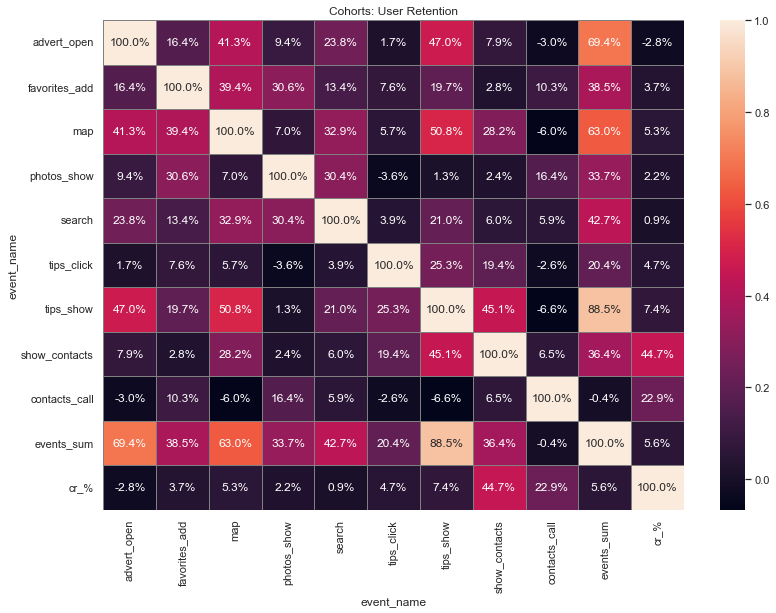

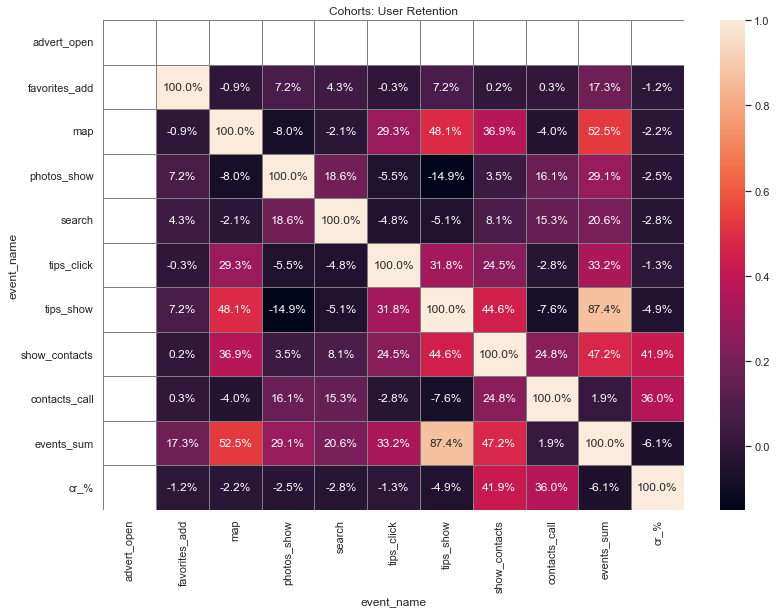

In [68]:
# построим таблицу с коэф. Пирсона и проверим гипотезу о равенстве долей
func_do_and_not(pivot_advert_open, pivot_not_advert_open)

##### Вывод по открытию карточки объявления

Первое, что нужно отметить -- для группы, в которой пользователи открывали карточки объявлений, характерная слабая положительная связь между действиями "увидели рекомендованные объявления" и "просмотрели фотографии" (1.3%). Во второй группе, где пользователи не открывали карточки, между этими действиями более сильная отрицательная связь -- -14.9%. По сути это логично: пользователи увидели рекомендованные объявления, но не открыли карточки объявлений, поэтому и не посмотрели фотографии.

Корреляция действий с целевым:

+ Для обеих групп всё так же характерны положительные связи с "просмотром рекомендованных объявлений", "кликами по ним" (во второй группе связь сильнее на 5%) и "просмотром карты объявлений" (во второй группе связь сильнее уже на 8%).

+ Во второй группе связь между просмотром контактов и звонком по номеру заметно сильнее -- 24.8% против 6.5% в первой группе.

+ Конверсия в целевое действие выше у пользователей, не открывавших карточку объявлений.

<br>
<br>

#### Просмотр фотографий в объявлении

Конверсия в первой группе:  0.2958904109589041
Конверсия во второй группе:  0.1821656050955414
p-значение:  2.220446049250313e-15
Отвергаем нулевую гипотезу: между долями есть значимая разница


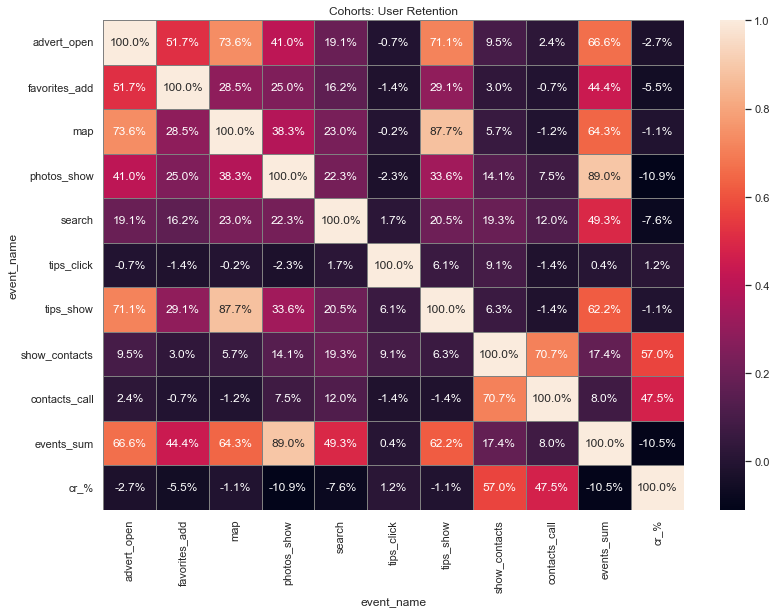

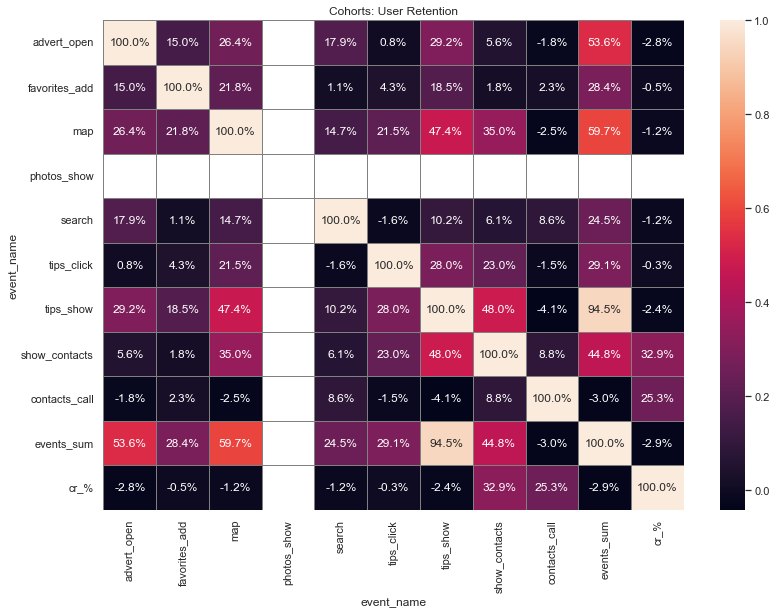

In [69]:
pivot_photos_show = dataset_pivot.query('photos_show > 0')
pivot_not_photos_show = dataset_pivot.query('photos_show == 0')

func_do_and_not(pivot_photos_show, pivot_not_photos_show)

##### Вывод по просмотру фотографий в объявлениях

1. Для группы пользователей, которые смотрели фотографии, характерно следующее:

    + сильная положительная связь между действиями, которые предшествуют целевому, кроме кликов по рекомендованным объявлениям;
    + при этом почти для всех действий характерна слабая связь с целевым;
    + сильная положительная связь между просмотром контактов и звонками.

2. Для группы пользователей, которые не смотрели фотографии, характерны те же корреляции, что и для генеральной совокупности -- сильная положительная корреляция между действиями "увидели рекомендованное объявление", "кликнули по нему", "просмотрели карту объявлений" и  целевым действием.
<br>
Можно сделать вывод, что на пользователей, которые не смотрят фотографии, сильно влияют эти три действия. А если пользователи смотрят фотографии, то все действия влияют на них не так сильно.

3. Конверсия в целевое действие выше у пользователей, просматривавших фотографии.
<br>
<br>


#### Увидел рекомендованные объявления

Конверсия в первой группе:  0.18136379864334165
Конверсия во второй группе:  0.2705718270571827
p-значение:  1.7360113346853723e-11
Отвергаем нулевую гипотезу: между долями есть значимая разница


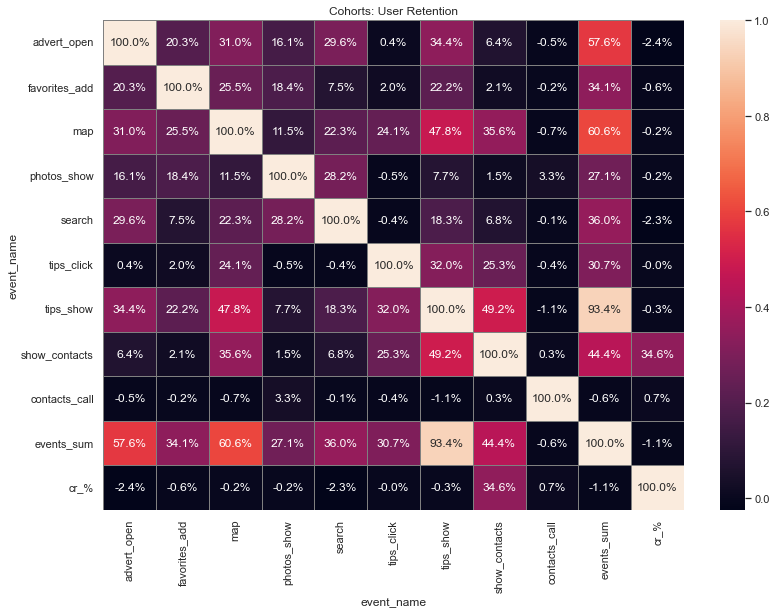

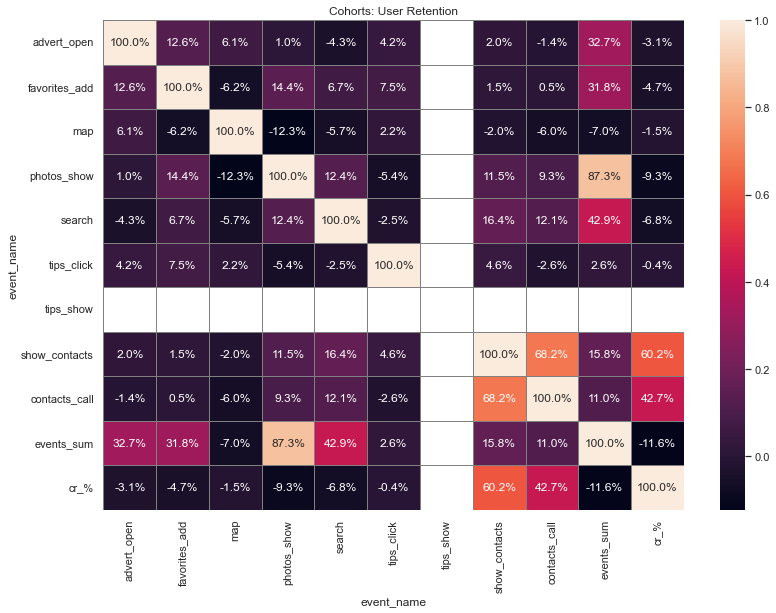

In [70]:
pivot_tips_show = dataset_pivot.query('tips_show > 0')
pivot_not_tips_show = dataset_pivot.query('tips_show == 0')

func_do_and_not(pivot_tips_show, pivot_not_tips_show)

##### Вывод по увиденным рекомендованным объявлениям

1. Для группы пользователей, которые увидели рекомендованные объявления, характерны те же корреляции между действиями, что и для всей совокупности. Кроме звонков по номерам. У этого действия отсутствует связь с оставльными.

2. Для группы пользователей, которые не увидели рекомендованных объявлений характерно:

    + слабые связи между всеми действиями и целевого. Отсутствует связь между просмотром карты объявлений и целевым, но сильнее, чем обычно связь между просмотром фото, поиском и целевым действием.
    + связь между просмотром контактов и звонками сильнее -- 68%.
<br>
3. Конверсия в целевое действие заменто выше у пользователей, не увидевших рекомендованные объявления.
Можно сделать вывод, что пользователи, которые не увидели рекомендованных объявлений, больше полагаются на поиск и просмотр фотографий.
<br>
<br>



#### Клики по рекомендованным объявлениям

Конверсия в первой группе:  0.2981366459627329
Конверсия во второй группе:  0.20444671607462306
p-значение:  7.59715747606915e-05
Отвергаем нулевую гипотезу: между долями есть значимая разница


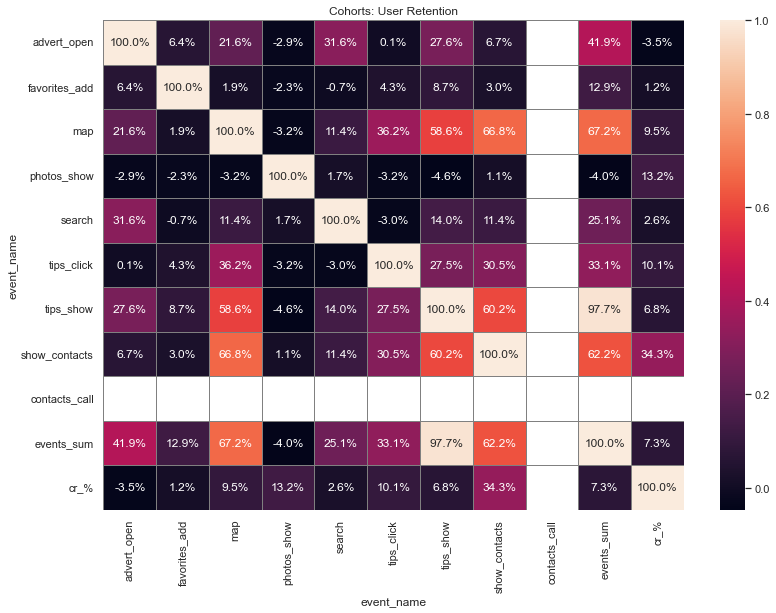

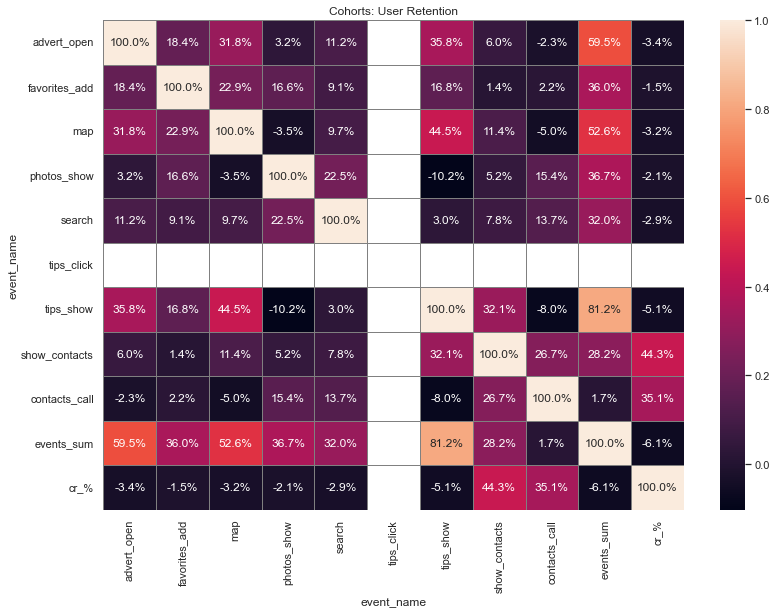

In [71]:
pivot_tips_click = dataset_pivot.query('tips_click > 0')
pivot_not_tips_click = dataset_pivot.query('tips_click == 0')

func_do_and_not(pivot_tips_click, pivot_not_tips_click)

##### Вывод по кликам по рекомендованным объявлениям

1. Пользователи, кликнувшие по рекомендованному объявлению, не звонили по контактному номеру.
2. Для группы, где пользователи не совершали этого действия, характерна более слабая связь между просмотром карты объявений и целевым.
3. Конверсия в целевое действие выше у пользователей, кликнувших по рекомендованному объявлению
<br>
<br>

#### Открытие карты объявлений

Конверсия в первой группе:  0.19574175824175824
Конверсия во второй группе:  0.21986326016552718
p-значение:  0.06791803061309354
Не получилось отвергнуть нулевую гипотезу, нет оснований считать доли разными


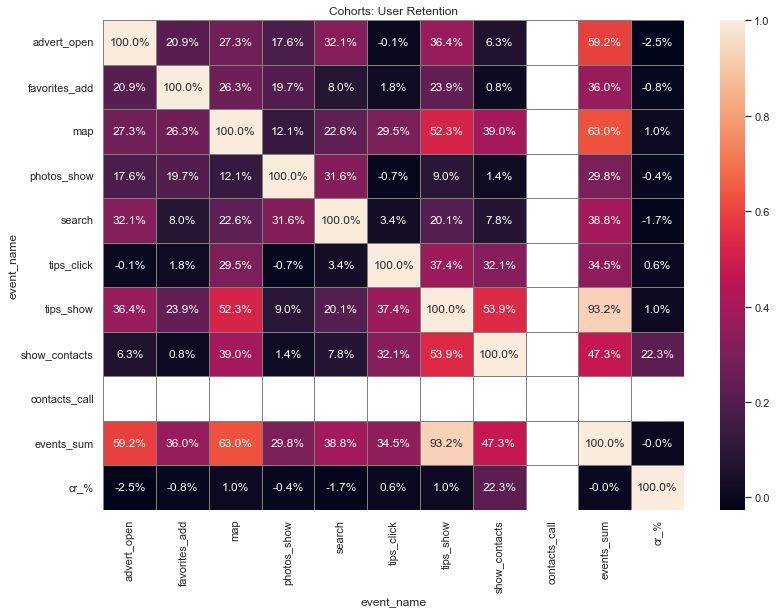

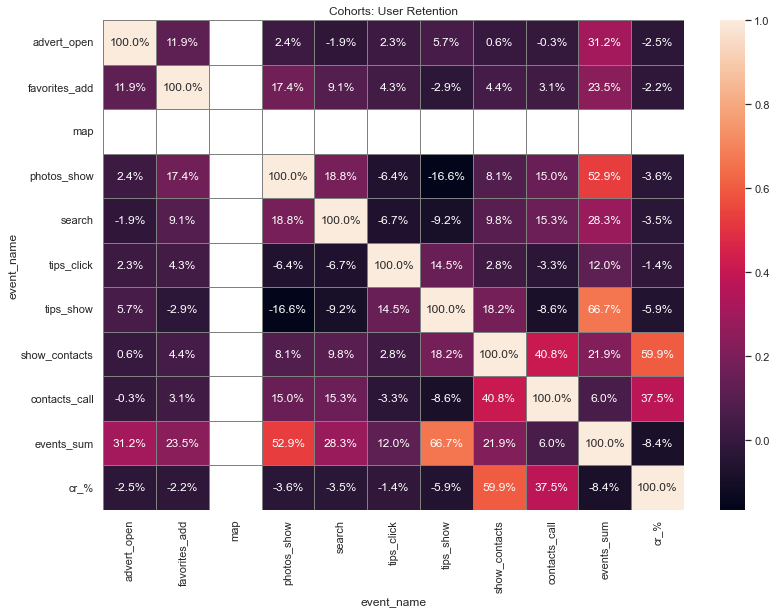

In [72]:
pivot_map = dataset_pivot.query('map > 0')
pivot_not_map = dataset_pivot.query('map == 0')

func_do_and_not(pivot_map, pivot_not_map)

##### Вывод по открытиям карты объявлений

1. Пользователи, которые открыли карту объявлений, характерна сильная связь этого действия с целевым, еще более сильная (53.9%) -- между действием "увидели рекомендованное объявление" и просмотром контаков. Но эти пользователи не звонили по номеру.

2. Для группы пользователей, которые не открывали карту объявлений, характерна сильная связь между просмотром контактов и звонком на номер. Но при этом слабая (либбо отсутствие) свзяь с остальными действиями. Чуть больше влияние, чем в первой группе, имеют поиск, просмотр фотографий и добавление в избранное. Открытие карточки никак не влияет на просмотр контактов.

3. Нельзя утверждать, что конверсия в целевое действие у какой-либо из этих двух групп выше.
<br>
<br>


#### Поиск в приложении

Конверсия в первой группе:  0.22268907563025211
Конверсия во второй группе:  0.20435967302452315
p-значение:  0.15366667646679555
Не получилось отвергнуть нулевую гипотезу, нет оснований считать доли разными


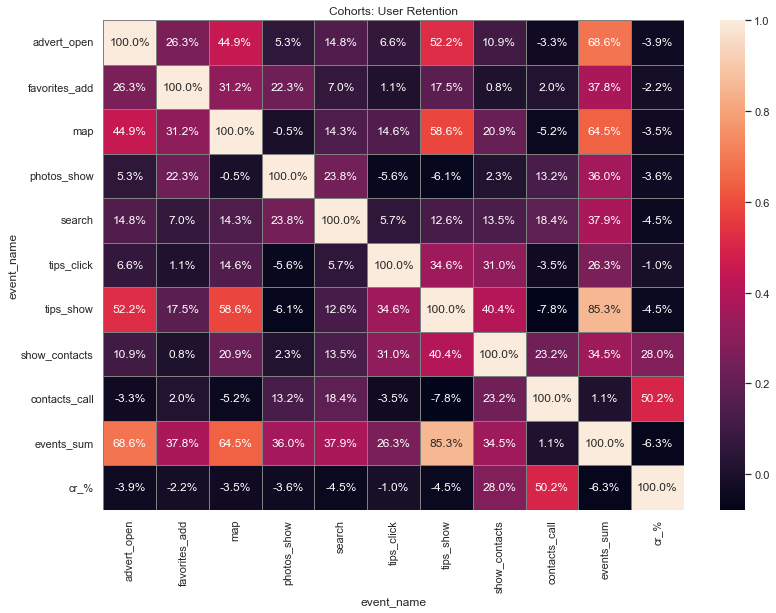

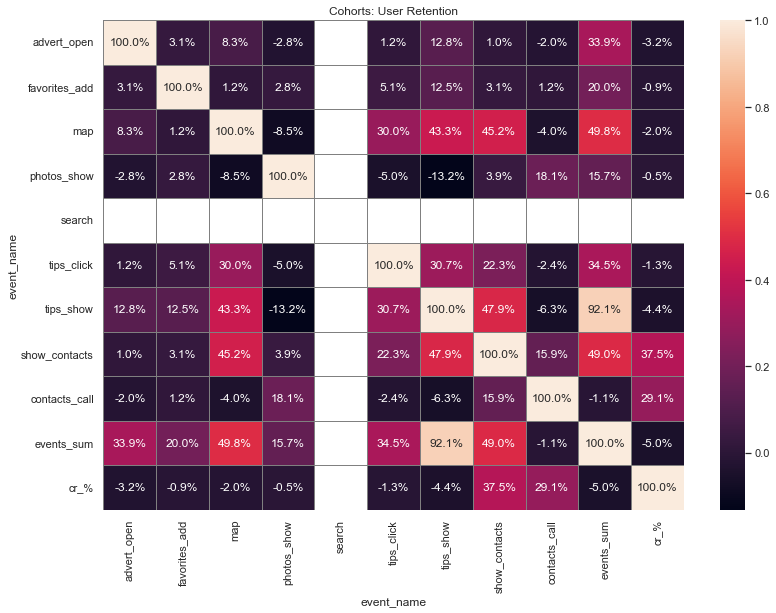

In [73]:
pivot_search = dataset_pivot.query('search > 0')
pivot_not_search = dataset_pivot.query('search == 0')

func_do_and_not(pivot_search, pivot_not_search)

##### Вывод по поиску в приложении

1. Для первой группы характерно:
    + сильная связь между дейтсвиями "увидели рекомендованное объявление" и "просмотр карточки";
    + более выраженная связь между просмотром карточек и целевым действием;
    + более выраженная связь между поиском и целевым действием.
    
2. Для второй группы характерно:
    + привычные сильные связи между тремя действиями и просмотром контактов.

3. Нельзя утверждать, что конверсия в целевое действие у какой-либо из этих двух групп выше.
<br>
<br>

#### Добавить объявление в избранное

Конверсия в первой группе:  0.3732193732193732
Конверсия во второй группе:  0.196961894953656
p-значение:  9.769962616701378e-15
Отвергаем нулевую гипотезу: между долями есть значимая разница


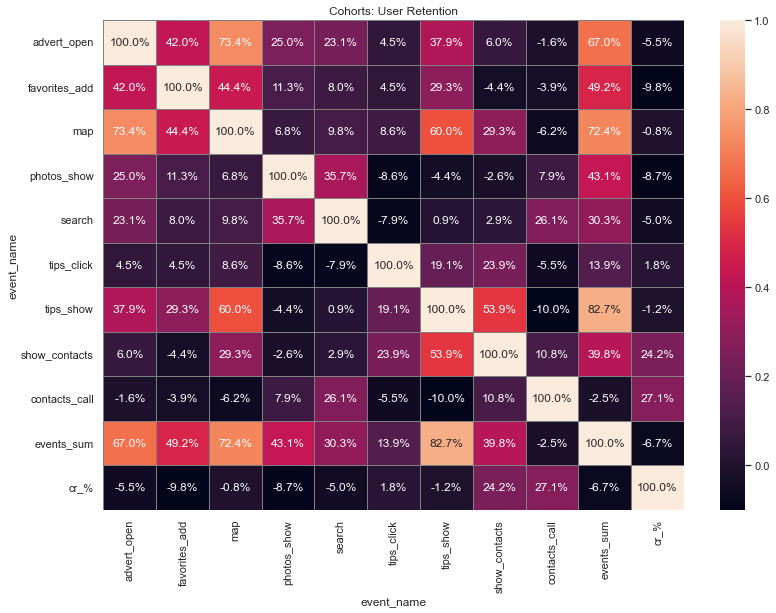

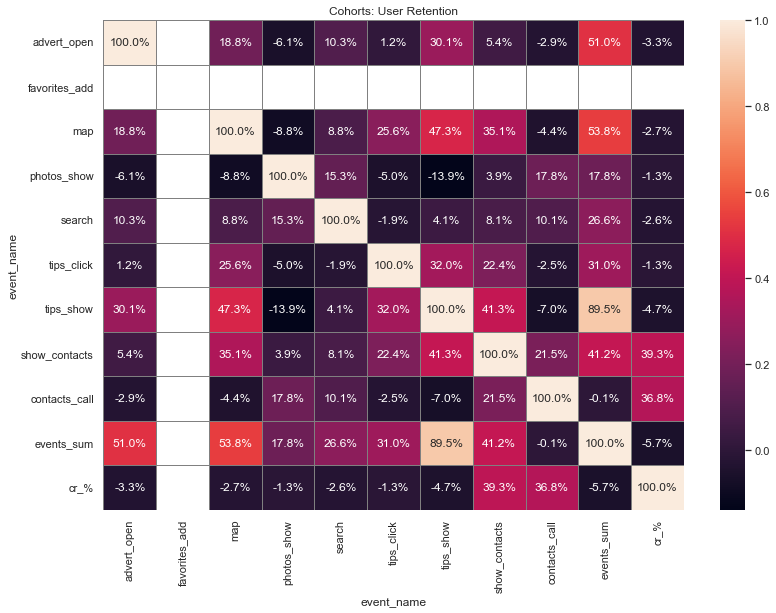

In [74]:
pivot_favorites_add = dataset_pivot.query('favorites_add > 0')
pivot_not_favorites_add = dataset_pivot.query('favorites_add == 0')

func_do_and_not(pivot_favorites_add, pivot_not_favorites_add)

##### Вывод по добавлению объявления в избранное

1. Группа "выполнили действие": слабая (почти отсутствующая), но отрицательная связь между целевым действием и добавлением в избранное, просмотром фотографий. Сильная связь целевого действия и "увидел рекомендованное объявление".

2. Нет отрицательных связей с целевым действием.

3. Конверсия в целевое действие выше у пользователей, добавивших объявление в избранное.
<br>
<br>

#### Звонок по номеру

Конверсия в первой группе:  0.973404255319149
Конверсия во второй группе:  0.1761798863355572
p-значение:  0.0
Отвергаем нулевую гипотезу: между долями есть значимая разница


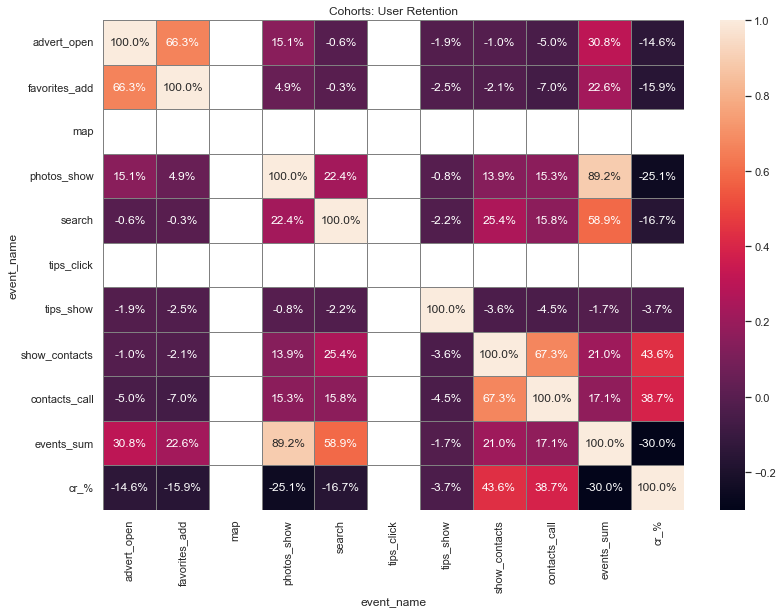

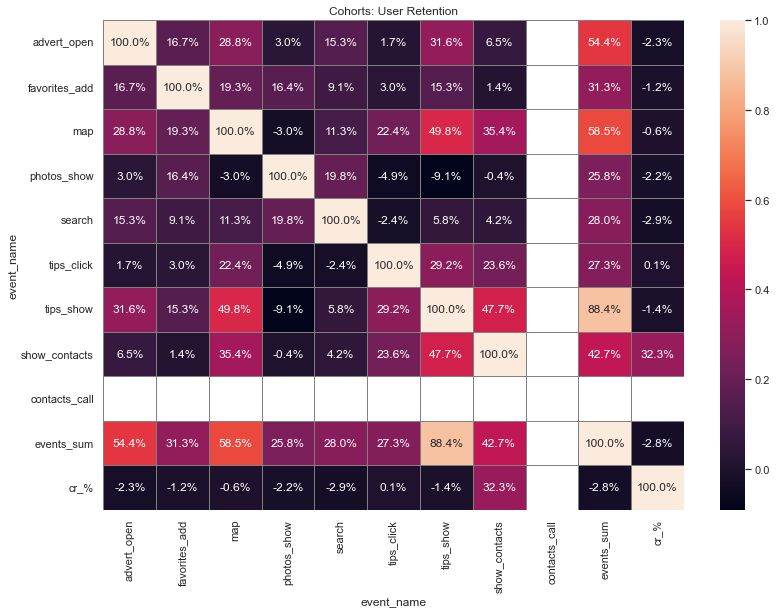

In [75]:
pivot_contacts_call = dataset_pivot.query('contacts_call > 0')
pivot_not_contacts_call = dataset_pivot.query('contacts_call == 0')

func_do_and_not(pivot_contacts_call, pivot_not_contacts_call)

##### Вывод по звонкам на номера

1. Пользователи, позвонившие по номеру:
    + слабая отрицательная связь между целевым действием и увиденными рекомендованными объявлениями, добавлением в избранное, открытием карточек;
    + среди звонивших нет тех, кто смотрел карту объявлений и кликал по рекомендованным.
    
2. Пользователи, не звонившие по номеру: более "привычные" связи между целевым и остальными действиями.
<br>
<br>


### Анализ поведения пользователей совершивших и не совершивших целевое действие

Конверсия в первой группе:  1.0
Конверсия во второй группе:  0.0
p-значение:  0.0
Отвергаем нулевую гипотезу: между долями есть значимая разница


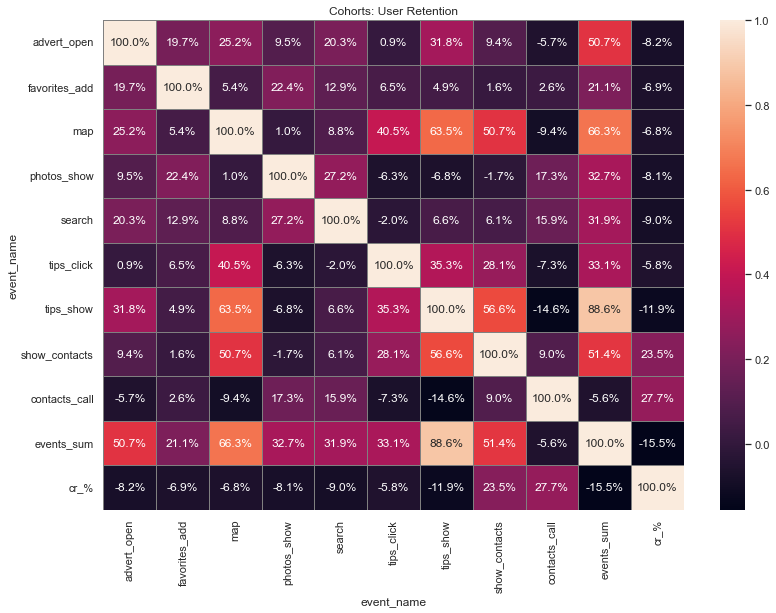

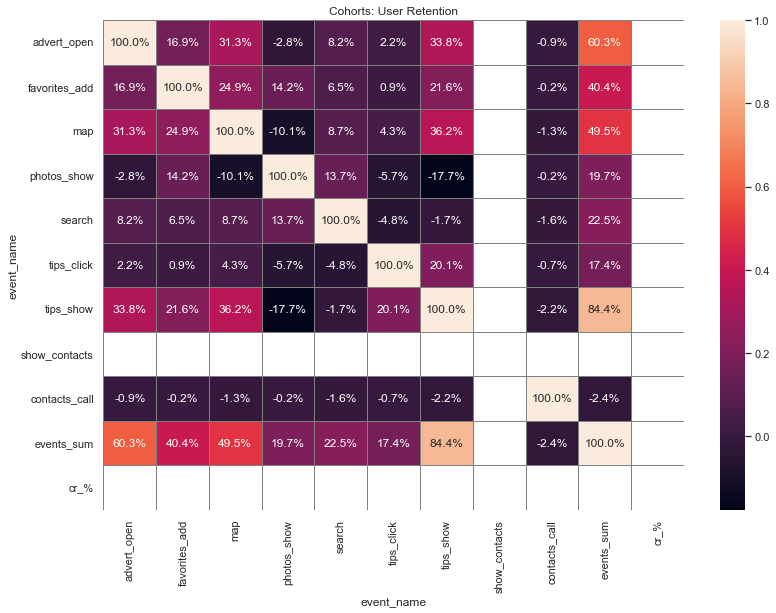

In [76]:
# разделим пользователей по целевому действию

pivot_show_contacts = dataset_pivot.query('show_contacts > 0')
pivot_not_show_contacts = dataset_pivot.query('show_contacts == 0')

func_do_and_not(pivot_show_contacts, pivot_not_show_contacts)

#### Вывод по двум группам пользователей

1. Пользователи, которые посмотрели контакты: 
    + сильная положительная связь целевого действия с увиденными рекомендованными объявлениями и просмотром карты объявлений;
    + умеренная связь с кликами по рекомендованным объявлениям;
    + отсутствует (очень слабая) связь с просмотром фотографий и добавлением в избранное.
    
2. Пользователи, которые не смотрели контакты:
    + Менее выраженные связи между всеми действиями пользователей -- сила связи максимум 36%.


### Анализ групп пользователей по источникам

In [77]:
# к сводной таблице подтянем данные по источникам
dataset_pivot = dataset_pivot.merge(sources, on='user_id', how='outer')
display(dataset_pivot.head())

,user_id,advert_open,favorites_add,map,photos_show,search,tips_click,tips_show,show_contacts,contacts_call,events_sum,cr_%,source
0,0001b1d5-b74a-4cbf-aeb0-7df5947bf349,0.0,0.0,6.0,0.0,0.0,0.0,29.0,0.0,0.0,35.0,0.0,other
1,00157779-810c-4498-9e05-a1e9e3cedf93,2.0,2.0,0.0,33.0,18.0,0.0,0.0,11.0,5.0,55.0,0.2,yandex
2,00463033-5717-4bf1-91b4-09183923b9df,0.0,0.0,0.0,10.0,0.0,0.0,0.0,0.0,0.0,10.0,0.0,yandex
3,004690c3-5a84-4bb7-a8af-e0c8f8fca64e,5.0,0.0,6.0,0.0,17.0,0.0,4.0,0.0,0.0,32.0,0.0,google
4,00551e79-152e-4441-9cf7-565d7eb04090,0.0,0.0,0.0,1.0,1.0,0.0,0.0,2.0,3.0,2.0,1.0,yandex


In [78]:
# разобъем на 3 таблицы
yandex = dataset_pivot.query('source == "yandex"')
google = dataset_pivot.query('source == "google"')
other = dataset_pivot.query('source == "other"')

Yandex


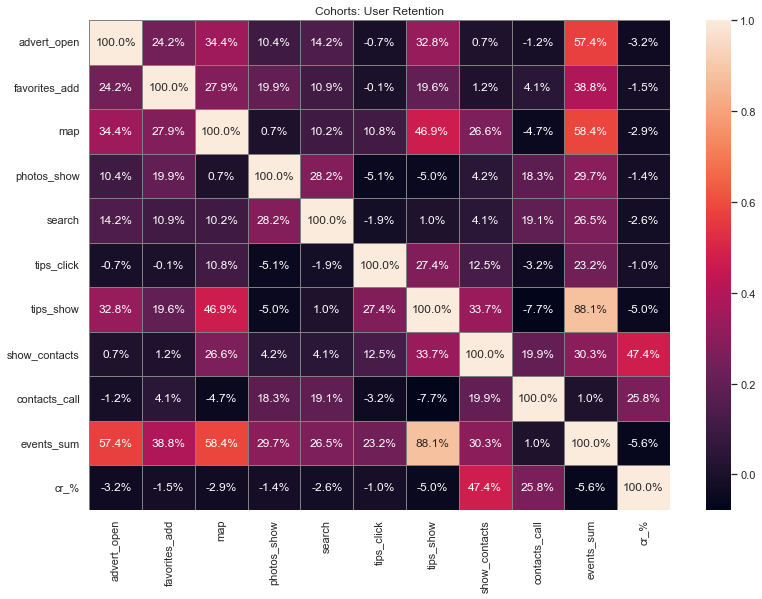

In [79]:
# рассчитаем корреляцию между показателями
yandex_corr = yandex.corr()
print('Yandex')
corr_map_func(yandex_corr)

Google


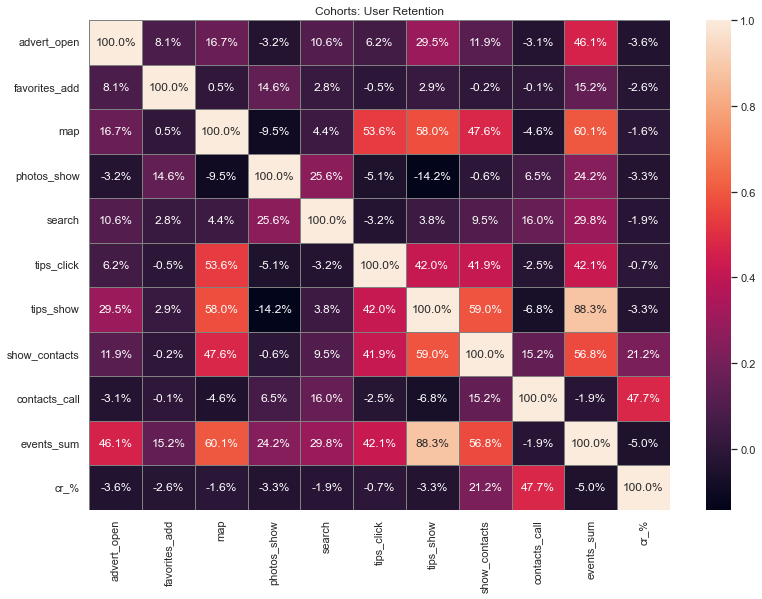

In [80]:
google_corr = google.corr()
print('Google')
corr_map_func(google_corr)

Other


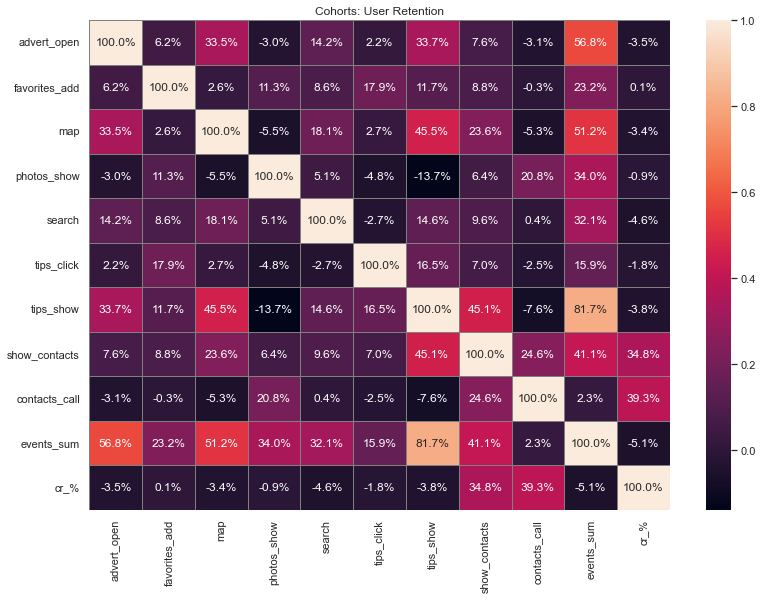

In [81]:
other_corr = other.corr()
print('Other')
corr_map_func(other_corr)

#### Вывод по анализу групп пользователей по источникам

Более сильная связь между целевым и остальными действиями -- у группы пользователей, которые пришли через google: 59% корреляция с увиденными рекомендованными объявлениями, 41.9% -- клики по ним, 47% -- с просмотром карты объявлений. В этой группе отсутствует связь между целевым событием и добавлением в избранное с просмотром фотографий. В двух других группах связь между ними более выраженная, но тоже слабая.

<br>

### Вывод по анализу влияния событий на совершение целевого события

По итогам анализа влияния событий на совершение целевого действия можно утверждать, что наиболее сильное влияние оказывают действия "увидели рекомендованные объявления", "кликнули по ним" и "открыли карту объявлений". Но при этом конверсия в целевое действие выше у пользователей, не увидевших рекомендованные объявления. А если пользователь кликнул по рекомендованному объявлению -- то конверсия выше, если не кликнул. Просмотр карты объявлений не увеличивает конверсию в ЦД -- мы не смогли доказать, что конверсия у этих групп отличается. Как и конверсия у тех, кто искал товар в поиске и не искал.

Наименьшее влияние у действий: добавление в избранное и просмотр фотографий. Фотографии могут так и побудить, так и заставить передумать от покупки. Но пользователи, посмотревшие фотографии и добавившие объявление в избранное, чаще совершают целевое действие.



## Проверка гипотез

### Первая гипотеза



__H0:__ 
Конверсия в просмотры контактов одинакова у двух групп пользователей: 1) совершают действия tips_show и tips_click; 2) совершают только tips_show.

__H1:__ 
Конверсия в просмотры контактов у вышеуказанных групп отличается.

Проверяем гипотезу о равенстве средних двух долей одной генеральной совокупности.

In [82]:
# разделим на 2 группы пользователей
tips_show_and_click = dataset_pivot.query('(tips_show != 0) and (tips_click > 0)')
only_tips_show = dataset_pivot.query('(tips_show != 0) and (tips_click == 0)')

In [83]:
# узнаем, сколько пользователей в группах
print('Количество пользователей, совершивших оба действия: ', tips_show_and_click.shape[0])
print('Количество пользователей, совершивших одно действие: ', only_tips_show.shape[0])

Количество пользователей, совершивших оба действия:  297
Количество пользователей, совершивших одно действие:  2504


Проверим, как распределены показатели конверсии в двух группах.

In [84]:
func_cr_calc(tips_show_and_click, only_tips_show)

Конверсия в первой группе:  0.2996632996632997
Конверсия во второй группе:  0.16733226837060702
p-значение:  2.1932031524229956e-08
Отвергаем нулевую гипотезу: между долями есть значимая разница


#### Вывод по первой гипотезе

Конверсия в просмотры контактов у двух групп пользователей (1.совершают действия tips_show и tips_click; 2. совершают только tips_show) отличаетс -- у первых конверсия выше.


### Вторая гипотеза

Проверим разницу конверсий у пользователей, пришедших из разных источников.

__H0:__
Конверсия в просмотры контактов одинакова у двух групп пользователей: 1) пришли из источника 1 и 2) пришли из источника 2.
(Проверим эту гипотезу для всех 3 источников попарно).

__H1:__
Конверсия в просмотры контактов у вышеуказанных групп отличается.

In [85]:
func_cr_calc(yandex, google)

Конверсия в первой группе:  0.2264736297828335
Конверсия во второй группе:  0.22143489813994685
p-значение:  0.7471784316819656
Не получилось отвергнуть нулевую гипотезу, нет оснований считать доли разными


In [86]:
func_cr_calc(yandex, other)

Конверсия в первой группе:  0.2264736297828335
Конверсия во второй группе:  0.16910569105691056
p-значение:  9.527058493263851e-05
Отвергаем нулевую гипотезу: между долями есть значимая разница


In [87]:
func_cr_calc(google, other)

Конверсия в первой группе:  0.22143489813994685
Конверсия во второй группе:  0.16910569105691056
p-значение:  0.0013280727404794135
Отвергаем нулевую гипотезу: между долями есть значимая разница


#### Вывод по второй гипотезе

Нельзя утверждать, что конверсия среди пользователей, пришедших через Яндекс и Гугл, отличается. Можно только утверждать, что она отличается у пользователей, пришедших через Другие источники, если сравнивать с Гуглом и Яндексом.


## Вывод по итогам анализа

В ходе анализа провели предварительную обработку данных. Провели исследовательский анализ: количество событий распределено равномерно за весь период данных, пользователи начинают активно пользоваться приложением с 8 утра и продолжают до 0 ночи. В среднем (медианное значение) на одного пользователя приходится 9 действий. Наибольшее количество совершенных действий -- увидели рекомендованное объявление. 

Для совершения целевого действия в среднем пользователю требуется 23 минуты, 75% пользователей (из посмотревших контакты) совершают его в течение 2.38 дней. Т.е. есть пользователи, которые совершают его за 1 сеанс, и те, кто делают это при повторном заходе.

По итогам анализа влияния событий на совершение целевого действия можно утверждать, что наиболее сильное влияние оказывают действия "увидели рекомендованные объявления", "кликнули по ним" и "открыли карту объявлений". Но при этом конверсия в целевое действие выше у пользователей, не увидевших рекомендованные объявления. А если пользователь кликнул по рекомендованному объявлению -- то конверсия выше, если не кликнул. Просмотр карты объявлений не увеличивает конверсию в ЦД -- мы не смогли доказать, что конверсия у этих групп отличается. Как и конверсия у тех, кто искал товар в поиске и не искал.

Наименьшее влияние у действий: добавление в избранное и просмотр фотографий. Фотографии могут так и побудить, так и заставить передумать от покупки. Но пользователи, посмотревшие фотографии и добавившие объявление в избранное, чаще совершают целевое действие.


По итогам проверки гипотез выяснили, что конверсия в целевое действие у разных групп (совершавших и не совершавших разные действия) отличается. Но нельзя утверждать, что отличается конверсия среди пользователей, пришедших через Яндекс и Гугл.